# PROBLEM-1:
An Automobile company named Austo Motor makes SUV, Sedan and Hatchboack car models.The company's board members raised some concerns regarding the marketing campaign's efficiency that is currently beening used.
We as a Data Scientist have to get the customers demand from the dataset and give some insights to the company.
   

First we load the necessary libraries that are required for Data exploration as written below.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Now we load the austo_automobile.csv file for the data exploration and see the first and last five lines of the dataset to get an idea about the variables and it's values.

In [2]:
df_cars = pd.read_csv('austo_automobile.csv')
df_cars.head()

,Age,Gender,Profession,Marital_status,Education,No_of_Dependents,Personal_loan,House_loan,Partner_working,Salary,Partner_salary,Total_salary,Price,Make
0,53,Male,Business,Married,Post Graduate,4,No,No,Yes,99300,70700.0,170000,61000,SUV
1,53,Femal,Salaried,Married,Post Graduate,4,Yes,No,Yes,95500,70300.0,165800,61000,SUV
2,53,Female,Salaried,Married,Post Graduate,3,No,No,Yes,97300,60700.0,158000,57000,SUV
3,53,Female,Salaried,Married,Graduate,2,Yes,No,Yes,72500,70300.0,142800,61000,SUV
4,53,Male,Salaried,Married,Post Graduate,3,No,No,Yes,79700,60200.0,139900,57000,SUV


In [3]:
df_cars.tail()

,Age,Gender,Profession,Marital_status,Education,No_of_Dependents,Personal_loan,House_loan,Partner_working,Salary,Partner_salary,Total_salary,Price,Make
1576,22,Male,Salaried,Single,Graduate,2,No,Yes,No,33300,0.0,33300,27000,Hatchback
1577,22,Male,Business,Married,Graduate,4,No,No,No,32000,NaN,32000,31000,Hatchback
1578,22,Male,Business,Single,Graduate,2,No,Yes,No,32900,0.0,32900,30000,Hatchback
1579,22,Male,Business,Married,Graduate,3,Yes,Yes,No,32200,NaN,32200,24000,Hatchback
1580,22,Male,Salaried,Married,Graduate,4,No,No,No,31600,0.0,31600,31000,Hatchback


### Data Structure.
Now we see how many rows and columns are present in the dataset using shape function.

We use info function to find out the data types of the variables.

We use describe function to find the min, max, count, std, mean, median, and three q1,q2,q3 quantiles of the numerical variables. 

In [4]:
df_cars.shape
print(f"No. of rows in the dataset:",df_cars.shape[0],"\nNo. of columns in the dataset:",df_cars.shape[1])

No. of rows in the dataset: 1581 
No. of columns in the dataset: 14


In [5]:
df_cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1581 entries, 0 to 1580
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Age               1581 non-null   int64  
 1   Gender            1528 non-null   object 
 2   Profession        1581 non-null   object 
 3   Marital_status    1581 non-null   object 
 4   Education         1581 non-null   object 
 5   No_of_Dependents  1581 non-null   int64  
 6   Personal_loan     1581 non-null   object 
 7   House_loan        1581 non-null   object 
 8   Partner_working   1581 non-null   object 
 9   Salary            1581 non-null   int64  
 10  Partner_salary    1475 non-null   float64
 11  Total_salary      1581 non-null   int64  
 12  Price             1581 non-null   int64  
 13  Make              1581 non-null   object 
dtypes: float64(1), int64(5), object(8)
memory usage: 173.1+ KB


In [6]:
df_cars.describe()

,Age,No_of_Dependents,Salary,Partner_salary,Total_salary,Price
count,1581.000000,1581.000000,1581.000000,1475.000000,1581.000000,1581.000000
mean,31.922201,2.457938,60392.220114,20225.559322,79625.996205,35597.722960
std,8.425978,0.943483,14674.825044,19573.149277,25545.857768,13633.636545
min,22.000000,0.000000,30000.000000,0.000000,30000.000000,18000.000000
25%,25.000000,2.000000,51900.000000,0.000000,60500.000000,25000.000000
50%,29.000000,2.000000,59500.000000,25600.000000,78000.000000,31000.000000
75%,38.000000,3.000000,71800.000000,38300.000000,95900.000000,47000.000000
max,54.000000,4.000000,99300.000000,80500.000000,171000.000000,70000.000000


We check if there are any duplicate values in the dataset and if there are we remove them. But, from the below output we see there are no dupilcated values in the whole dataset.

We also check for the any empty values present in any variables is isnull function as shown in the below lines.

In [7]:
dupli = df_cars.duplicated().sum()
print(f"The no.of duplicate row in data set are",dupli)

The no.of duplicate row in data set are 0


In [8]:
df_cars.isnull().sum()

Age                   0
Gender               53
Profession            0
Marital_status        0
Education             0
No_of_Dependents      0
Personal_loan         0
House_loan            0
Partner_working       0
Salary                0
Partner_salary      106
Total_salary          0
Price                 0
Make                  0
dtype: int64

Now we will check the counts for different variable available in the categorical variables to check for bad or any corrupted values present in them.

In [9]:
print(df_cars.Gender.value_counts())
print(df_cars.Profession.value_counts())
print(df_cars.Marital_status.value_counts())
print(df_cars.Education.value_counts())
print(df_cars.Personal_loan.value_counts())
print(df_cars.House_loan.value_counts())
print(df_cars.Partner_working.value_counts())
print(df_cars.Make.value_counts())

Gender
Male      1199
Female     327
Femal        1
Femle        1
Name: count, dtype: int64
Profession
Salaried    896
Business    685
Name: count, dtype: int64
Marital_status
Married    1443
Single      138
Name: count, dtype: int64
Education
Post Graduate    985
Graduate         596
Name: count, dtype: int64
Personal_loan
Yes    792
No     789
Name: count, dtype: int64
House_loan
No     1054
Yes     527
Name: count, dtype: int64
Partner_working
Yes    868
No     713
Name: count, dtype: int64
Make
Sedan        702
Hatchback    582
SUV          297
Name: count, dtype: int64


We found out that there are 2 corrupted values present in the Gender column.

First we see where this bad values are located in the dataset and then using loc method we replace those values to 'Female'as
shownin below lines.

From the above we know that there are 53 null values present in Gender column and 106 empty values in Partner_salary column.

In Gender variables we use mode function and replace those anomalies with the mode of those variables. Re-check using unique function.

In [10]:
df_cars[(df_cars.Gender == 'Femal') | (df_cars.Gender == 'Femle')]

,Age,Gender,Profession,Marital_status,Education,No_of_Dependents,Personal_loan,House_loan,Partner_working,Salary,Partner_salary,Total_salary,Price,Make
1,53,Femal,Salaried,Married,Post Graduate,4,Yes,No,Yes,95500,70300.0,165800,61000,SUV
305,40,Femle,Business,Married,Post Graduate,4,No,No,Yes,70000,70800.0,140800,65000,SUV


In [11]:
# df_cars.Gender = df_cars.Gender.replace('Femal', 'Female')
# df_cars.Gender = df_cars.Gender.replace('Femle', 'Female')
df_cars.loc[1,'Gender'] = 'Female'
df_cars.loc[305,'Gender'] = 'Female'

In [12]:
df_cars.Gender.unique()

array(['Male', 'Female', nan], dtype=object)

Using isnull function we get the missing values in both the Gender and Partner Salary columns respectively.
Using mode we find out which the most recurring value in Gender and replace the empty values with that value.
And for partner salary, just subtract Salary from Total salary.As even if the partner working columns have value No. As, we will get value 0 as in that case salary and total salary will be the same in case of partner not working.

In [13]:
df_cars.Gender.isnull().sum()

53

In [14]:
df_cars.Gender.mode()

0    Male
Name: Gender, dtype: object

In [15]:
df_cars.Gender = df_cars.Gender.fillna('Male')

In [16]:
df_cars.Partner_salary = df_cars.Total_salary - df_cars.Salary

In [17]:
df_cars.isnull().sum()

Age                 0
Gender              0
Profession          0
Marital_status      0
Education           0
No_of_Dependents    0
Personal_loan       0
House_loan          0
Partner_working     0
Salary              0
Partner_salary      0
Total_salary        0
Price               0
Make                0
dtype: int64

In [18]:
df_cars.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1581.0,31.922201,8.425978,22.0,25.0,29.0,38.0,54.0
No_of_Dependents,1581.0,2.457938,0.943483,0.0,2.0,2.0,3.0,4.0
Salary,1581.0,60392.220114,14674.825044,30000.0,51900.0,59500.0,71800.0,99300.0
Partner_salary,1581.0,19233.776091,19670.391171,0.0,0.0,25100.0,38100.0,80500.0
Total_salary,1581.0,79625.996205,25545.857768,30000.0,60500.0,78000.0,95900.0,171000.0
Price,1581.0,35597.722960,13633.636545,18000.0,25000.0,31000.0,47000.0,70000.0


We recheck the columns for empty values and see we have dealt with that and see the statistical summary using describe function for better understanding of numerical variables.

## Uni-variate Analysis

We will perform univariate analysis for each and evey categorical and numberical variables.

And if there are any outliers in the dataset we will treat them as per the requirements.

We will do univariate analysis for all the Categorical Variables as shown below.

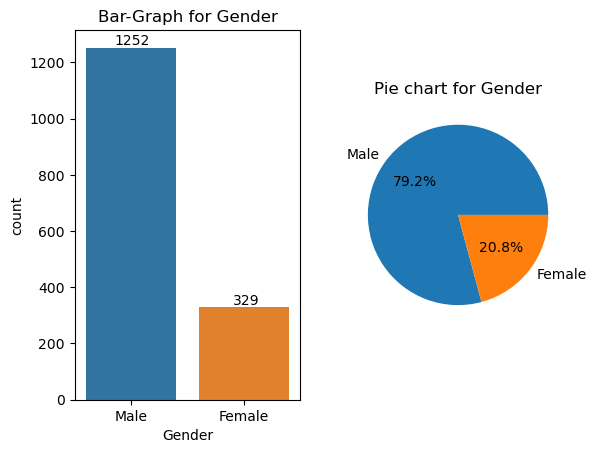

In [19]:
plt.subplot(1,2,1)
plt.title('Bar-Graph for Gender')
sns.countplot(df_cars,x='Gender');
plt.text(x = 0.90, y = df_cars.Gender.value_counts()[1]+10, s = df_cars.Gender.value_counts()[1])
plt.text(x = -0.15, y = df_cars.Gender.value_counts()[0]+10, s = df_cars.Gender.value_counts()[0])
plt.subplot(1,2,2)
plt.title('Pie chart for Gender')
plt.pie(df_cars.Gender.value_counts(),autopct = '%.1f%%',labels=["Male","Female"]);

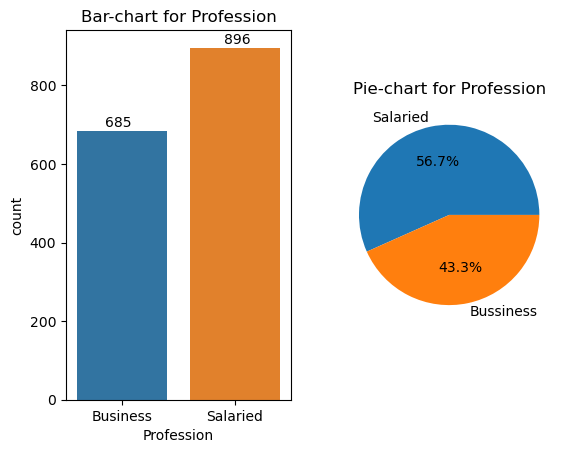

In [20]:
plt.subplot(1,2,1)
plt.title('Bar-chart for Profession')
sns.countplot(df_cars,x='Profession');
plt.text(x = -0.15, y =df_cars.Profession.value_counts()[1]+10, s = df_cars.Profession.value_counts()[1])
plt.text(x = 0.90, y = df_cars.Profession.value_counts()[0]+10, s = df_cars.Profession.value_counts()[0])
plt.subplot(1,2,2)
plt.title('Pie-chart for Profession')
plt.pie(df_cars.Profession.value_counts(),autopct = '%.1f%%',labels=["Salaried","Bussiness"]);

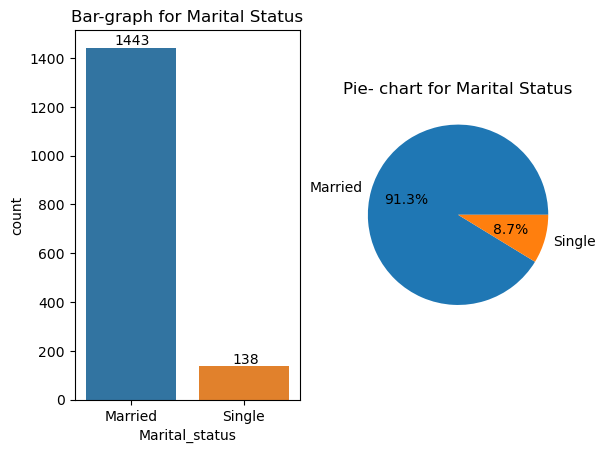

In [21]:
plt.subplot(1,2,1)
plt.title('Bar-graph for Marital Status')
sns.countplot(df_cars,x='Marital_status');
plt.text(x = 0.90, y =df_cars.Marital_status.value_counts()[1]+10, s = df_cars.Marital_status.value_counts()[1])
plt.text(x = -0.15, y = df_cars.Marital_status.value_counts()[0]+10, s = df_cars.Marital_status.value_counts()[0])
plt.subplot(1,2,2)
plt.title('Pie- chart for Marital Status')
plt.pie(df_cars.Marital_status.value_counts(),autopct = '%.1f%%',labels=["Married","Single"]);

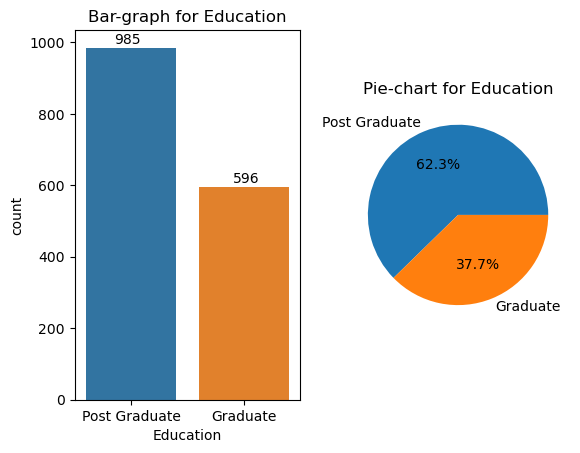

In [22]:
plt.subplot(1,2,1)
plt.title('Bar-graph for Education')
sns.countplot(df_cars,x='Education');
plt.text(x = 0.90, y =df_cars.Education.value_counts()[1]+10, s = df_cars.Education.value_counts()[1])
plt.text(x = -0.15, y = df_cars.Education.value_counts()[0]+10, s = df_cars.Education.value_counts()[0])
plt.subplot(1,2,2)
plt.title('Pie-chart for Education')
plt.pie(df_cars.Education.value_counts(),autopct = '%.1f%%',labels=["Post Graduate","Graduate"]);

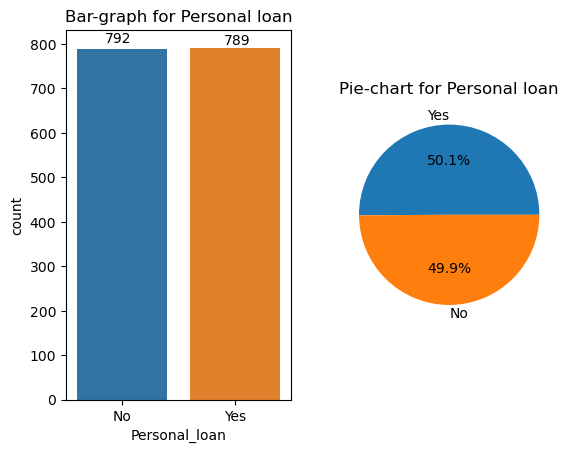

In [23]:
plt.subplot(1,2,1)
plt.title('Bar-graph for Personal loan')
sns.countplot(df_cars,x='Personal_loan');
plt.text(x = 0.90, y =df_cars.Personal_loan.value_counts()[1]+10, s = df_cars.Personal_loan.value_counts()[1])
plt.text(x = -0.15, y = df_cars.Personal_loan.value_counts()[0]+10, s = df_cars.Personal_loan.value_counts()[0])
plt.subplot(1,2,2)
plt.title('Pie-chart for Personal loan')
plt.pie(df_cars.Personal_loan.value_counts(),autopct = '%.1f%%',labels=["Yes","No"]);
#df_cars.Personal_loan.value_counts().plot(kind = 'pie', rot=0)

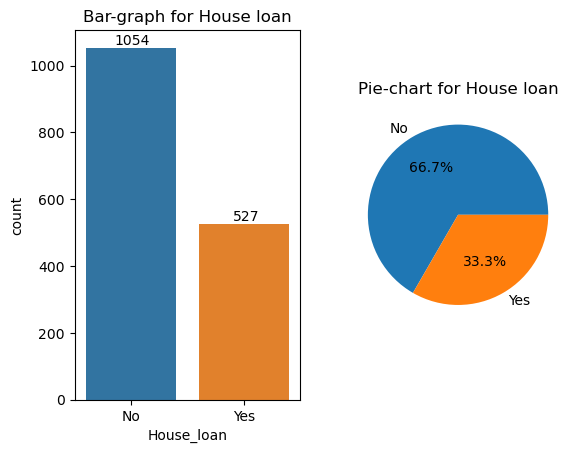

In [24]:
plt.subplot(1,2,1)
plt.title('Bar-graph for House loan')
sns.countplot(df_cars,x='House_loan');
plt.text(x = 0.90, y =df_cars.House_loan.value_counts()[1]+10, s = df_cars.House_loan.value_counts()[1])
plt.text(x = -0.15, y = df_cars.House_loan.value_counts()[0]+10, s = df_cars.House_loan.value_counts()[0])
plt.subplot(1,2,2)
plt.title('Pie-chart for House loan')
#df_cars.House_loan.value_counts().plot(kind = 'pie', rot=0)
plt.pie(df_cars.House_loan.value_counts(),autopct = '%.1f%%',labels=["No","Yes"]);

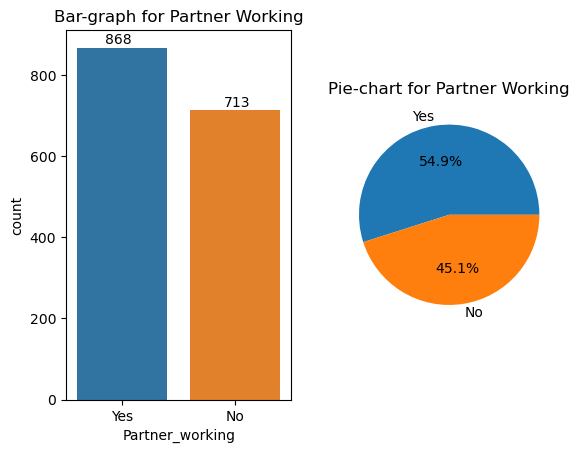

In [25]:
plt.subplot(1,2,1)
plt.title('Bar-graph for Partner Working')
sns.countplot(df_cars,x='Partner_working');
plt.text(x = 0.90, y =df_cars.Partner_working.value_counts()[1]+10, s = df_cars.Partner_working.value_counts()[1])
plt.text(x = -0.15, y = df_cars.Partner_working.value_counts()[0]+10, s = df_cars.Partner_working.value_counts()[0])
plt.subplot(1,2,2)
plt.title('Pie-chart for Partner Working')
plt.pie(df_cars.Partner_working.value_counts(),autopct = '%.1f%%',labels=["Yes","No"]);
#df_cars.Partner_working.value_counts().plot(kind = 'pie', rot=0)

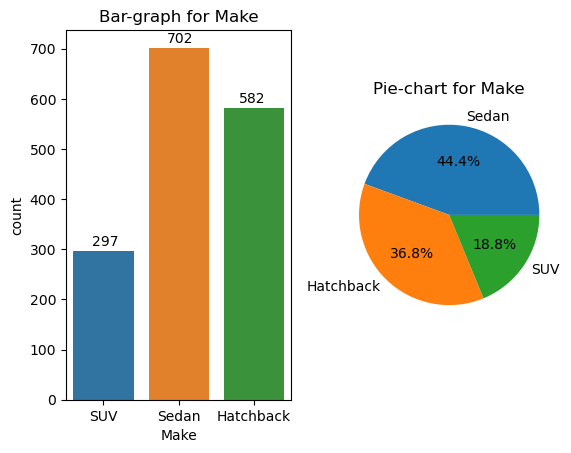

In [26]:
plt.subplot(1,2,1)
plt.title('Bar-graph for Make')
sns.countplot(df_cars,x='Make');
plt.text(x = -0.15, y = df_cars.Make.value_counts()[2]+10, s = df_cars.Make.value_counts()[2])
plt.text(x = 1.8, y =df_cars.Make.value_counts()[1]+10, s = df_cars.Make.value_counts()[1])
plt.text(x = 0.85, y = df_cars.Make.value_counts()[0]+10, s = df_cars.Make.value_counts()[0])
plt.subplot(1,2,2)
plt.title('Pie-chart for Make')
plt.pie(df_cars.Make.value_counts(),autopct='%.1f%%',labels=["Sedan","Hatchback","SUV"]);
#df_cars.Make.value_counts().plot(kind = 'pie', rot = 0)

Now, we will do Univariate analysis for numerical variables as shown below.

Text(-0.15, 30, '20')

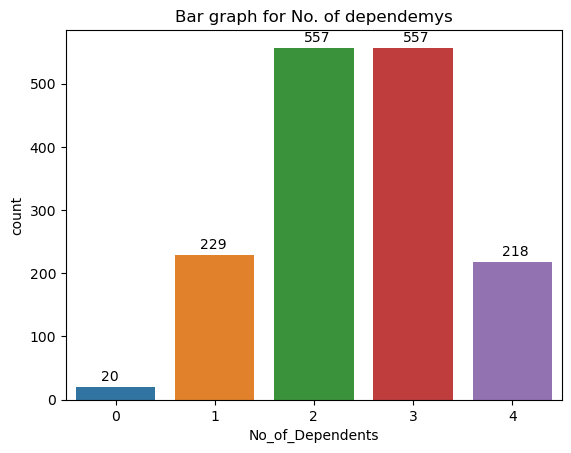

In [27]:
plt.title('Bar graph for No. of dependemys')
sns.countplot(df_cars,x='No_of_Dependents');
plt.text(x = 3.9, y = df_cars.No_of_Dependents.value_counts()[4]+9, s = df_cars.No_of_Dependents.value_counts()[4])
plt.text(x = 1.9, y = df_cars.No_of_Dependents.value_counts()[3]+9, s = df_cars.No_of_Dependents.value_counts()[3])
plt.text(x = 2.9, y = df_cars.No_of_Dependents.value_counts()[2]+9, s = df_cars.No_of_Dependents.value_counts()[2])
plt.text(x = 0.85, y =df_cars.No_of_Dependents.value_counts()[1]+10, s = df_cars.No_of_Dependents.value_counts()[1])
plt.text(x = -0.15, y = df_cars.No_of_Dependents.value_counts()[0]+10, s = df_cars.No_of_Dependents.value_counts()[0])
#df_cars.No_of_Dependents.value_counts().plot(kind='pie',rot=0, autopct = '%.1f%%')

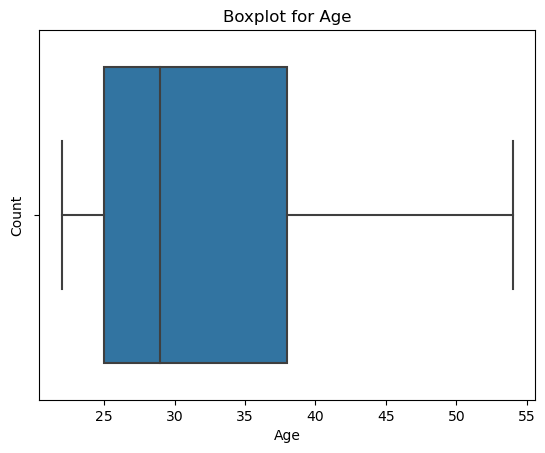

In [28]:
plt.title('Boxplot for Age')
plt.ylabel('Count')
sns.boxplot(df_cars,x='Age');

<Axes: title={'center': 'Histogram for Age'}, xlabel='Age', ylabel='Count'>

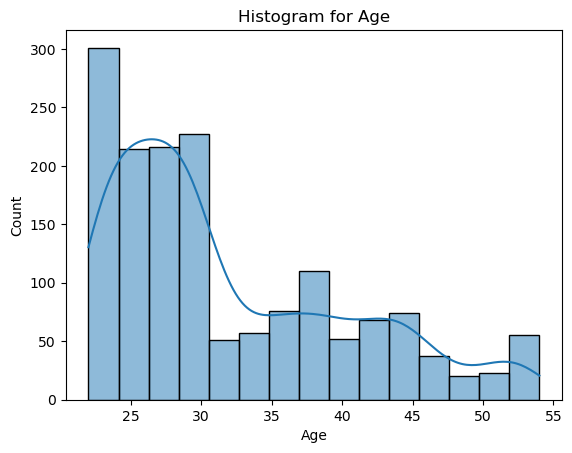

In [29]:
plt.title('Histogram for Age');
sns.histplot(df_cars,x='Age',kde=True)

<Axes: title={'center': 'Boxplot for Price'}, xlabel='Price', ylabel='Count'>

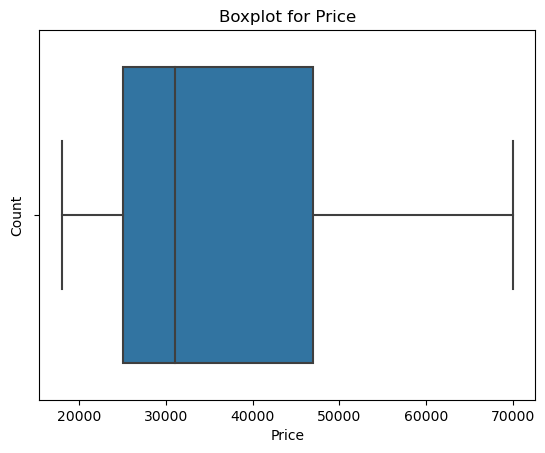

In [30]:
plt.title('Boxplot for Price')
plt.ylabel('Count')
sns.boxplot(df_cars,x='Price')

<Axes: title={'center': 'Histogram for Price'}, xlabel='Price', ylabel='Count'>

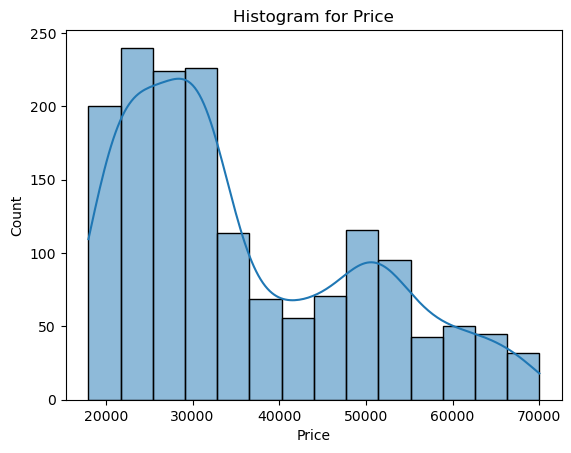

In [31]:
plt.title('Histogram for Price');
sns.histplot(df_cars,x='Price',kde=True)

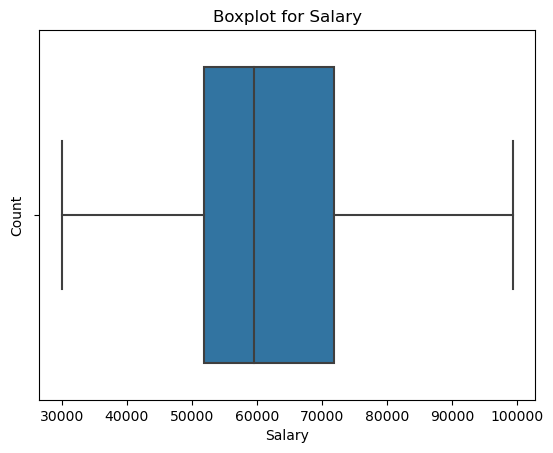

In [32]:
plt.title('Boxplot for Salary')
plt.ylabel('Count')
sns.boxplot(df_cars, x='Salary');

<Axes: title={'center': 'Histogram for Salary'}, xlabel='Salary', ylabel='Count'>

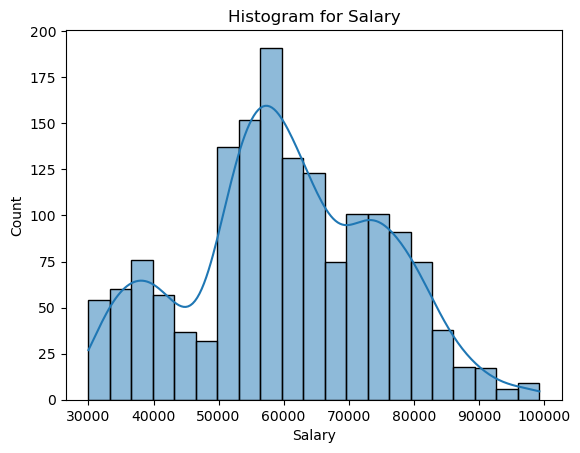

In [33]:
plt.title('Histogram for Salary');
sns.histplot(df_cars,x='Salary',kde=True)

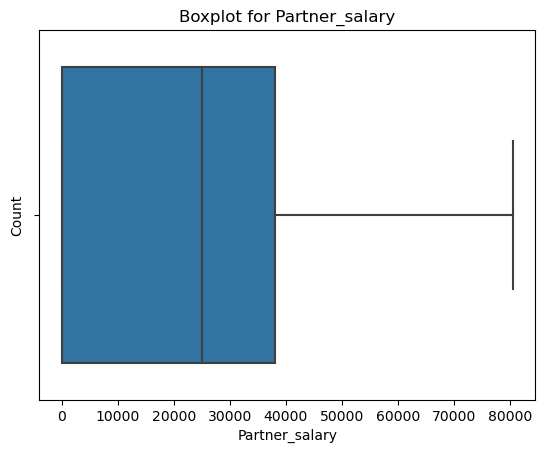

In [34]:
plt.title('Boxplot for Partner_salary')
plt.ylabel('Count')
sns.boxplot(df_cars, x='Partner_salary');

<Axes: title={'center': 'Histogram for Partner Salary'}, xlabel='Partner_salary', ylabel='Count'>

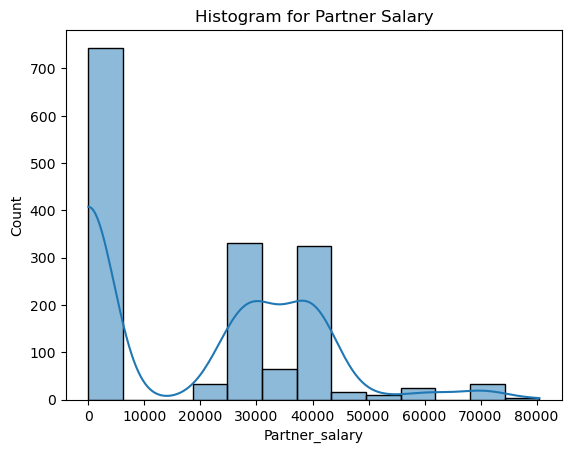

In [35]:
plt.title('Histogram for Partner Salary');
sns.histplot(df_cars,x='Partner_salary',kde=True)

<Axes: title={'center': 'Boxplot for Total_salary before outliers treatment'}, xlabel='Total_salary', ylabel='Count'>

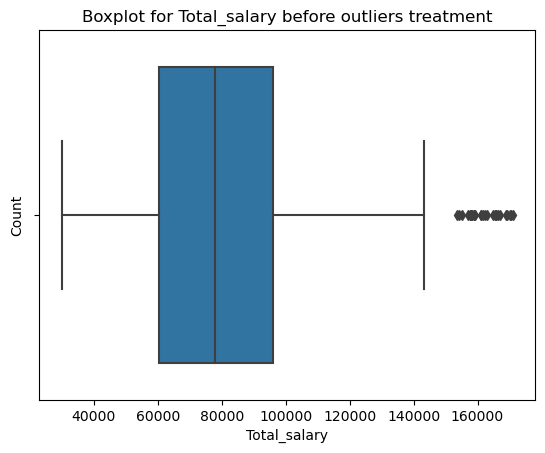

In [36]:
plt.title('Boxplot for Total_salary before outliers treatment')
plt.ylabel('Count')
sns.boxplot(df_cars,x='Total_salary')

<Axes: title={'center': 'Histogram for Total Salary before outliers treatment'}, xlabel='Total_salary', ylabel='Count'>

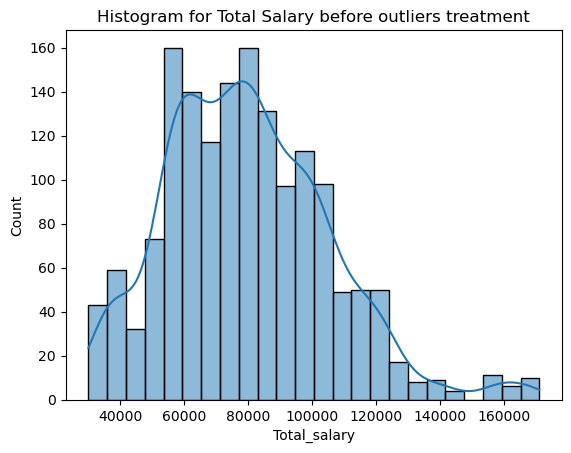

In [37]:
plt.title('Histogram for Total Salary before outliers treatment');
sns.histplot(df_cars,x='Total_salary',kde=True)

For the Total salary variable we will perform outliers treatment using IQR method. The steps are as shown below:

In [38]:
q1 = df_cars.Total_salary.quantile(0.25)
q3 = df_cars.Total_salary.quantile(0.75)
IQR = q3-q1
print(q1,q3,IQR)

60500.0 95900.0 35400.0


In [39]:
uplim = q3+(1.5*IQR)
lowlim = q1-(1.5*IQR)
print(uplim,lowlim)

149000.0 7400.0


In [40]:
df_cars.Total_salary = np.where(df_cars.Total_salary<lowlim,lowlim,df_cars.Total_salary)
df_cars.Total_salary = np.where(df_cars.Total_salary>uplim,uplim,df_cars.Total_salary)

Now we will again plot the graph for the Total salary after outliers treatment.

<Axes: title={'center': 'Boxplot for Total_salary after outliers treatment'}, xlabel='Total_salary', ylabel='Count'>

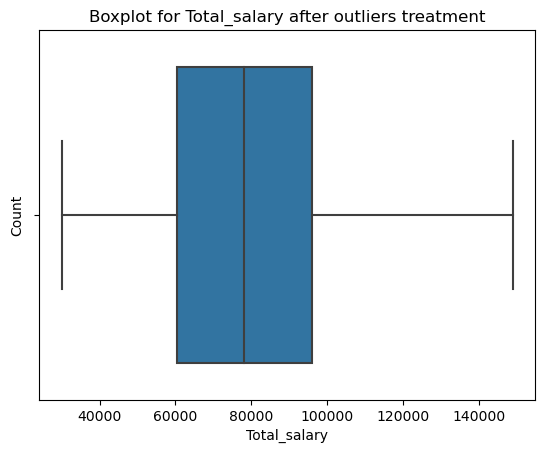

In [41]:
plt.title('Boxplot for Total_salary after outliers treatment')
plt.ylabel('Count')
sns.boxplot(df_cars,x='Total_salary')

<Axes: title={'center': 'Histogram for Total Salary after outliers treatment'}, xlabel='Total_salary', ylabel='Count'>

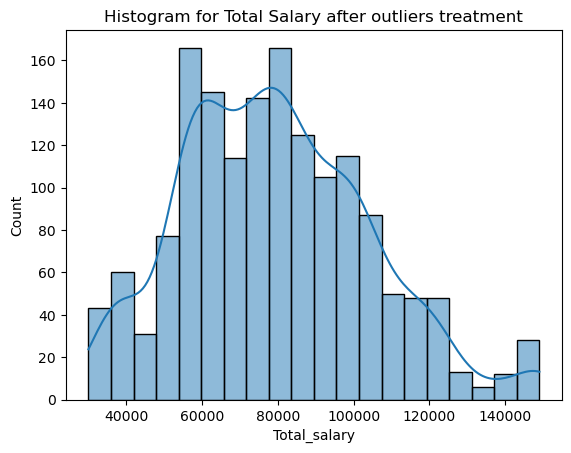

In [42]:
plt.title('Histogram for Total Salary after outliers treatment');
sns.histplot(df_cars,x='Total_salary',kde=True)

## Bi-variate Analysis:

We will perform Bi-variate analysis for all numerical variables.

we will also observe the correlations between numerical variables.

We will explore the relationships between categorical vs numerical variables.

The below graph we see that pairplot is used for bi-variate analysis of all numerical variables.

C:\Users\Harsh Patel\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2500x1500 with 0 Axes>

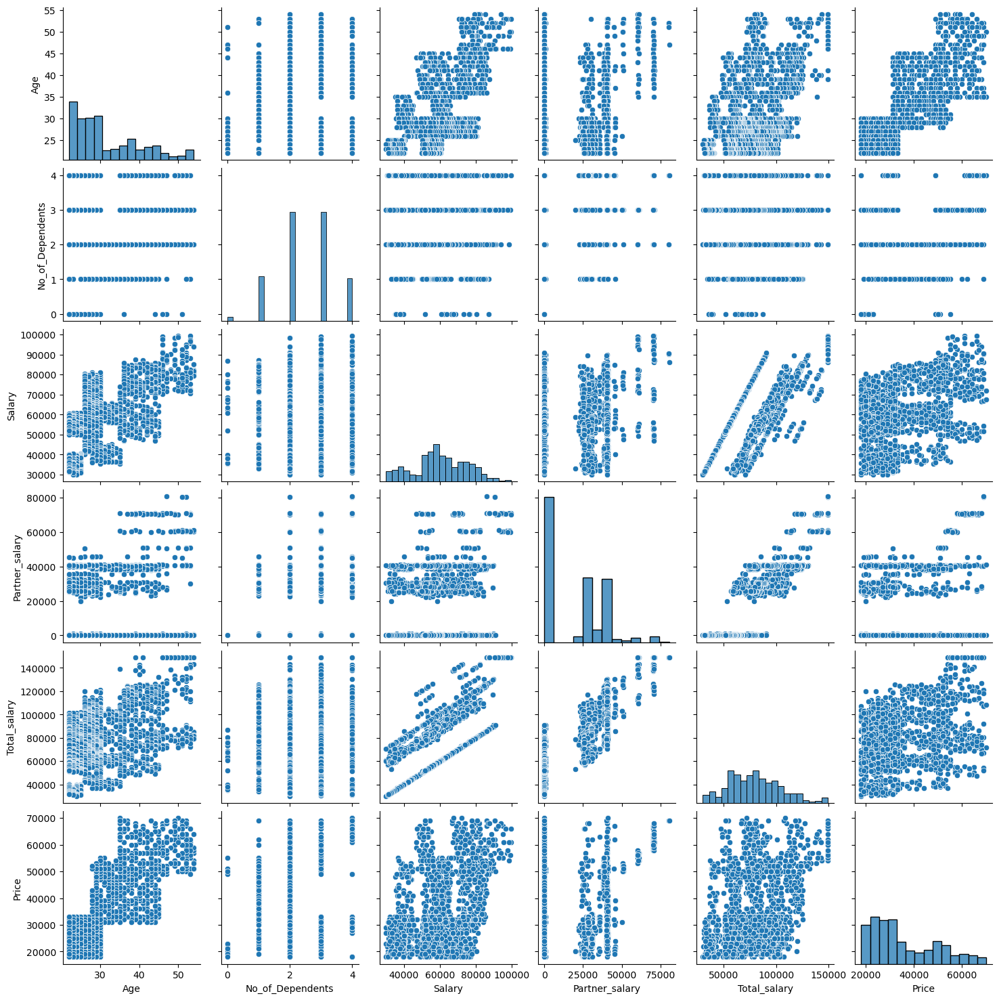

In [43]:
plt.figure(figsize=(25,15))
sns.pairplot(data=df_cars,vars = ['Age','No_of_Dependents','Salary','Partner_salary','Total_salary','Price']);

Observation:

1.we can see that as the total salary increase as salary, total salary aslo increases when partner salary increase is increases.
2.we can see that No of dependents has no affect on other numeric variables.
3.we can see that price increase as Age is also increases.
4.we can see that as age increase salary aslo increases.

Now we will see the correlationship between the numerical variables using corr() function and we will use heatmap for better understanding for that.

In [44]:
df_cars1 = df_cars[['Age','No_of_Dependents','Salary','Partner_salary','Total_salary','Price']]
df_cars1.corr()

,Age,No_of_Dependents,Salary,Partner_salary,Total_salary,Price
Age,1.000000,-0.189614,0.616899,0.135702,0.452844,0.797831
No_of_Dependents,-0.189614,1.000000,-0.031746,0.144320,0.087606,-0.135839
Salary,0.616899,-0.031746,1.000000,0.087155,0.638625,0.409920
Partner_salary,0.135702,0.144320,0.087155,1.000000,0.819248,0.171875
Total_salary,0.452844,0.087606,0.638625,0.819248,1.000000,0.359651
Price,0.797831,-0.135839,0.409920,0.171875,0.359651,1.000000


<Axes: >

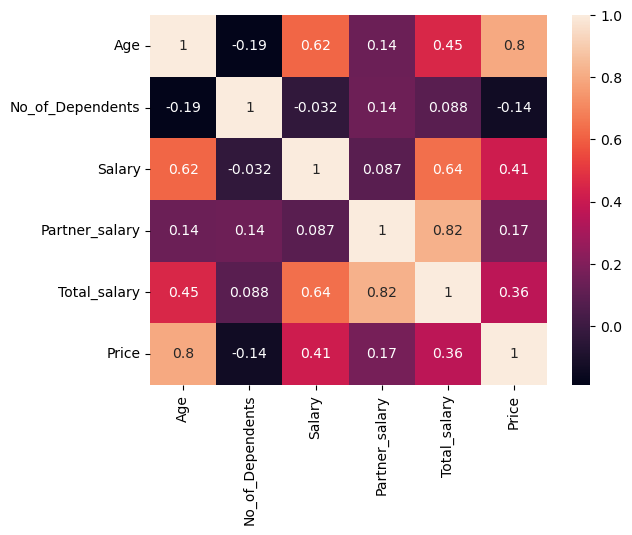

In [45]:
sns.heatmap(df_cars1.corr(),annot = True)

From the above heatmap we can see that there is relationship between total salary with salary and partner salary respectively.
We also see the relationship between age with price, total salary and with Salary variables respectively.

Now we will only do exploration of relationship between all categorical vs numerical variable.

The first one is between Age and all other categorical variables as shown below.

<Axes: xlabel='Make', ylabel='Age'>

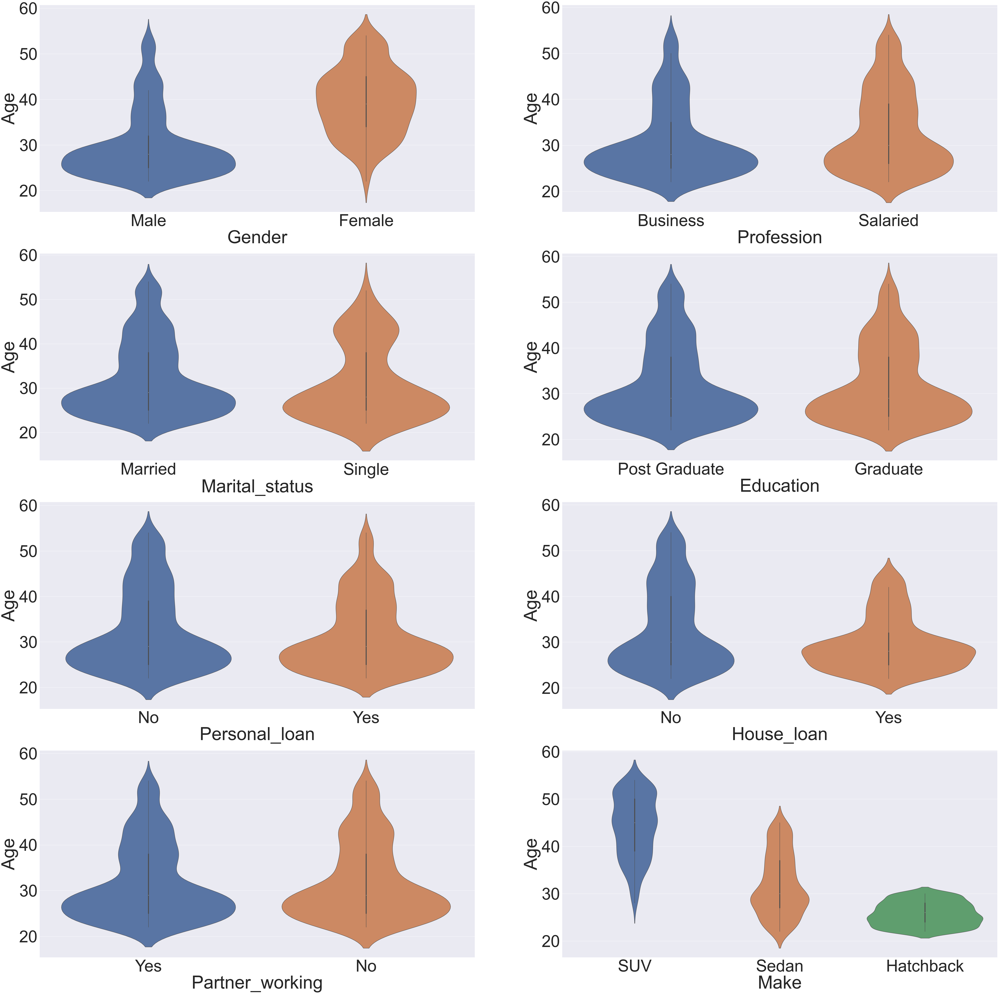

In [69]:
fig, axis = plt.subplots(nrows=4,ncols=2)
fig.set_size_inches(80,80)
sns.set(font_scale=8)
sns.violinplot(df_cars,x='Gender',y='Age',ax=axis[0][0])
sns.violinplot(df_cars,x='Profession',y='Age',ax=axis[0][1])
sns.violinplot(df_cars,x='Marital_status',y='Age',ax=axis[1][0])
sns.violinplot(df_cars,x='Education',y='Age',ax=axis[1][1])
sns.violinplot(df_cars,x='Personal_loan',y='Age',ax=axis[2][0])
sns.violinplot(df_cars,x='House_loan',y='Age',ax=axis[2][1])
sns.violinplot(df_cars,x='Partner_working',y='Age',ax=axis[3][0])
sns.violinplot(df_cars,x='Make',y='Age',ax=axis[3][1])

The second is between No of Dependents and all other categorical variables as shown below.

<Axes: xlabel='Make', ylabel='No_of_Dependents'>

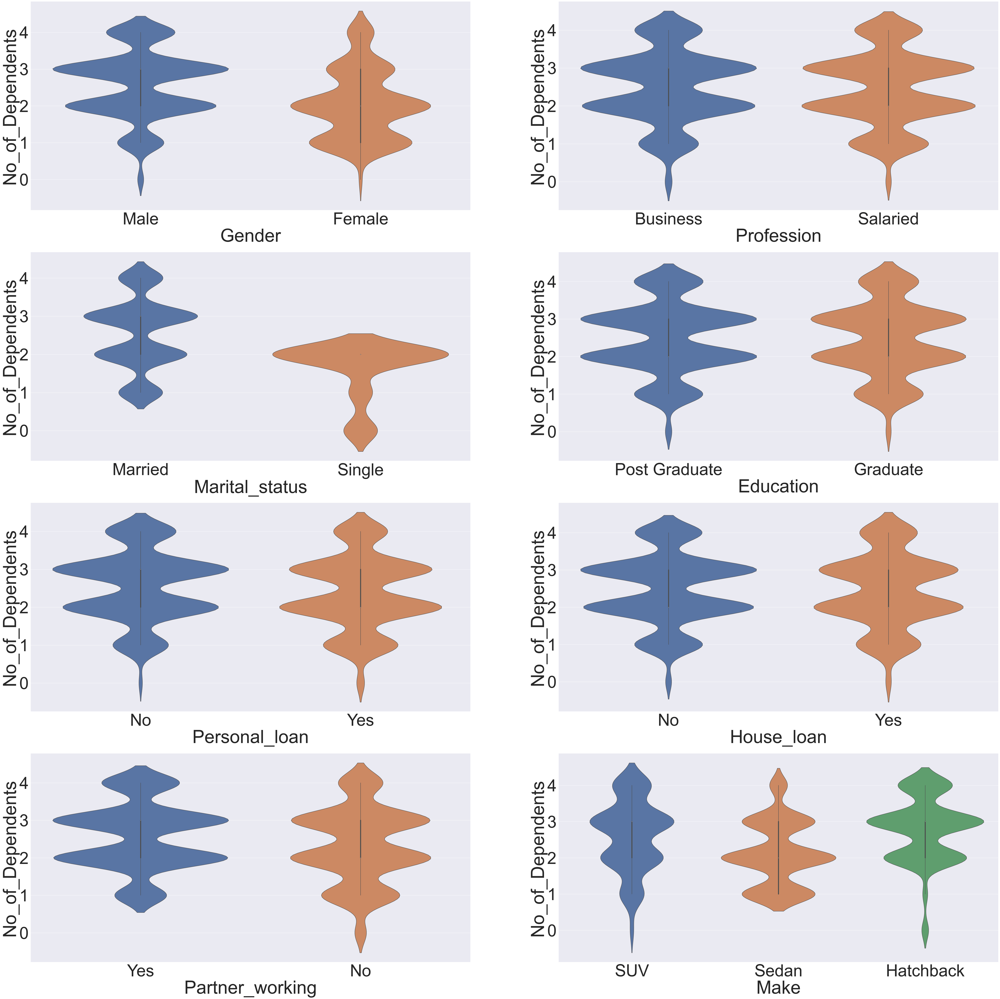

In [64]:
fig, axes = plt.subplots(nrows=4,ncols=2)
fig.set_size_inches(80,80)
sns.set(font_scale=7)
sns.violinplot(df_cars,x='Gender',y='No_of_Dependents',ax=axes[0][0])
sns.violinplot(df_cars,x='Profession',y='No_of_Dependents',ax=axes[0][1])
sns.violinplot(df_cars,x='Marital_status',y='No_of_Dependents',ax=axes[1][0])
sns.violinplot(df_cars,x='Education',y='No_of_Dependents',ax=axes[1][1])
sns.violinplot(df_cars,x='Personal_loan',y='No_of_Dependents',ax=axes[2][0])
sns.violinplot(df_cars,x='House_loan',y='No_of_Dependents',ax=axes[2][1])
sns.violinplot(df_cars,x='Partner_working',y='No_of_Dependents',ax=axes[3][0])
sns.violinplot(df_cars,x='Make',y='No_of_Dependents',ax=axes[3][1])

The Third is between Salary and all other categorical variables as shown below.

<Axes: xlabel='Make', ylabel='Salary'>

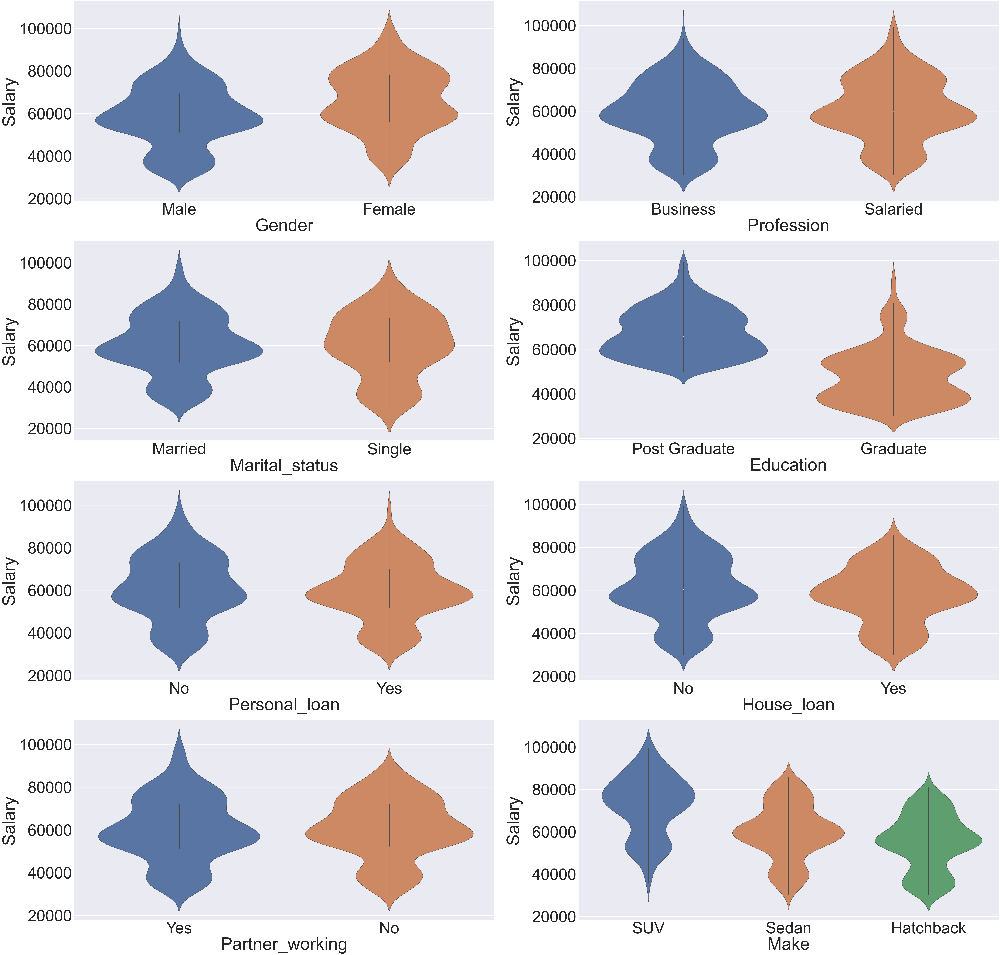

In [65]:
fig, axes = plt.subplots(nrows=4,ncols=2)
fig.set_size_inches(80,80)
sns.set(font_scale=7)
sns.violinplot(df_cars,x='Gender',y='Salary',ax=axes[0][0])
sns.violinplot(df_cars,x='Profession',y='Salary',ax=axes[0][1])
sns.violinplot(df_cars,x='Marital_status',y='Salary',ax=axes[1][0])
sns.violinplot(df_cars,x='Education',y='Salary',ax=axes[1][1])
sns.violinplot(df_cars,x='Personal_loan',y='Salary',ax=axes[2][0])
sns.violinplot(df_cars,x='House_loan',y='Salary',ax=axes[2][1])
sns.violinplot(df_cars,x='Partner_working',y='Salary',ax=axes[3][0])
sns.violinplot(df_cars,x='Make',y='Salary',ax=axes[3][1])

The Fourth is between Partner salary and all other categorical variables as shown below.

<Axes: xlabel='Make', ylabel='Partner_salary'>

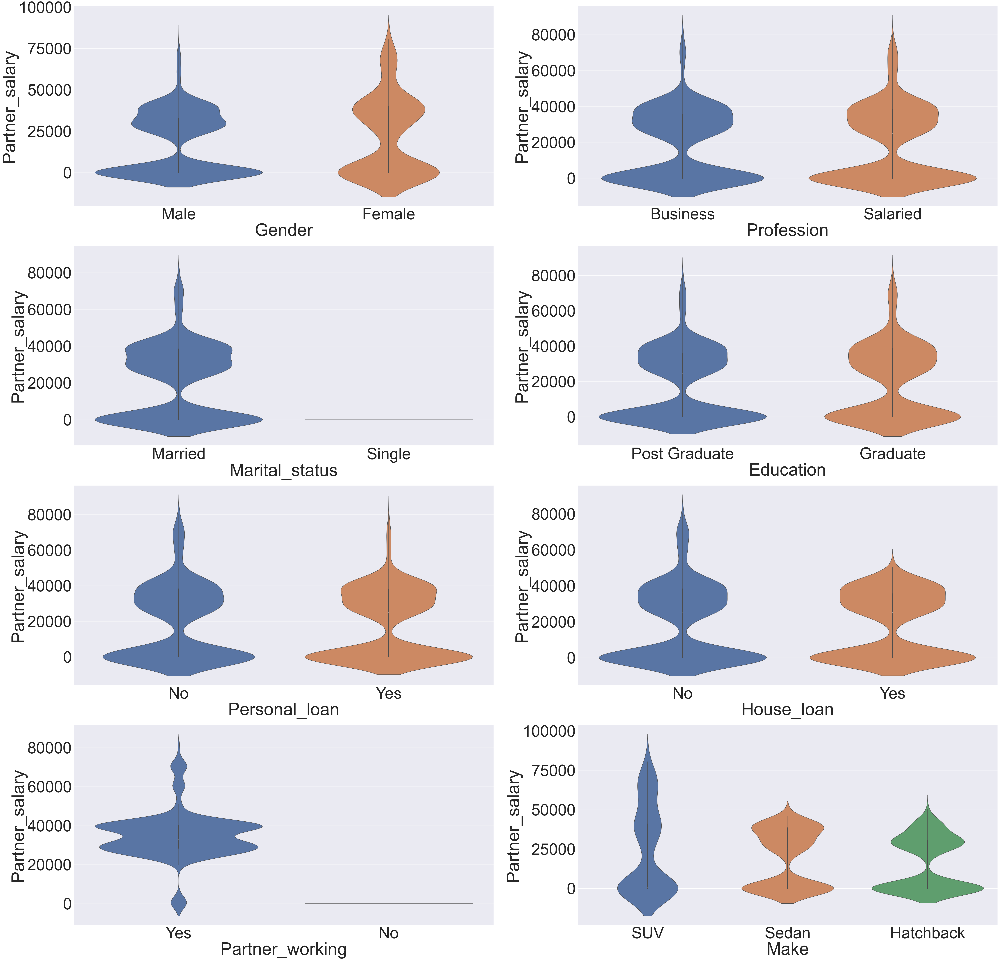

In [66]:
fig, axes = plt.subplots(nrows=4,ncols=2)
fig.set_size_inches(80,80)
sns.set(font_scale=7)
sns.violinplot(df_cars,x='Gender',y='Partner_salary',ax=axes[0][0])
sns.violinplot(df_cars,x='Profession',y='Partner_salary',ax=axes[0][1])
sns.violinplot(df_cars,x='Marital_status',y='Partner_salary',ax=axes[1][0])
sns.violinplot(df_cars,x='Education',y='Partner_salary',ax=axes[1][1])
sns.violinplot(df_cars,x='Personal_loan',y='Partner_salary',ax=axes[2][0])
sns.violinplot(df_cars,x='House_loan',y='Partner_salary',ax=axes[2][1])
sns.violinplot(df_cars,x='Partner_working',y='Partner_salary',ax=axes[3][0])
sns.violinplot(df_cars,x='Make',y='Partner_salary',ax=axes[3][1])

The Fifth is between Total salary and all other categorical variables as shown below.

<Axes: xlabel='Make', ylabel='Total_salary'>

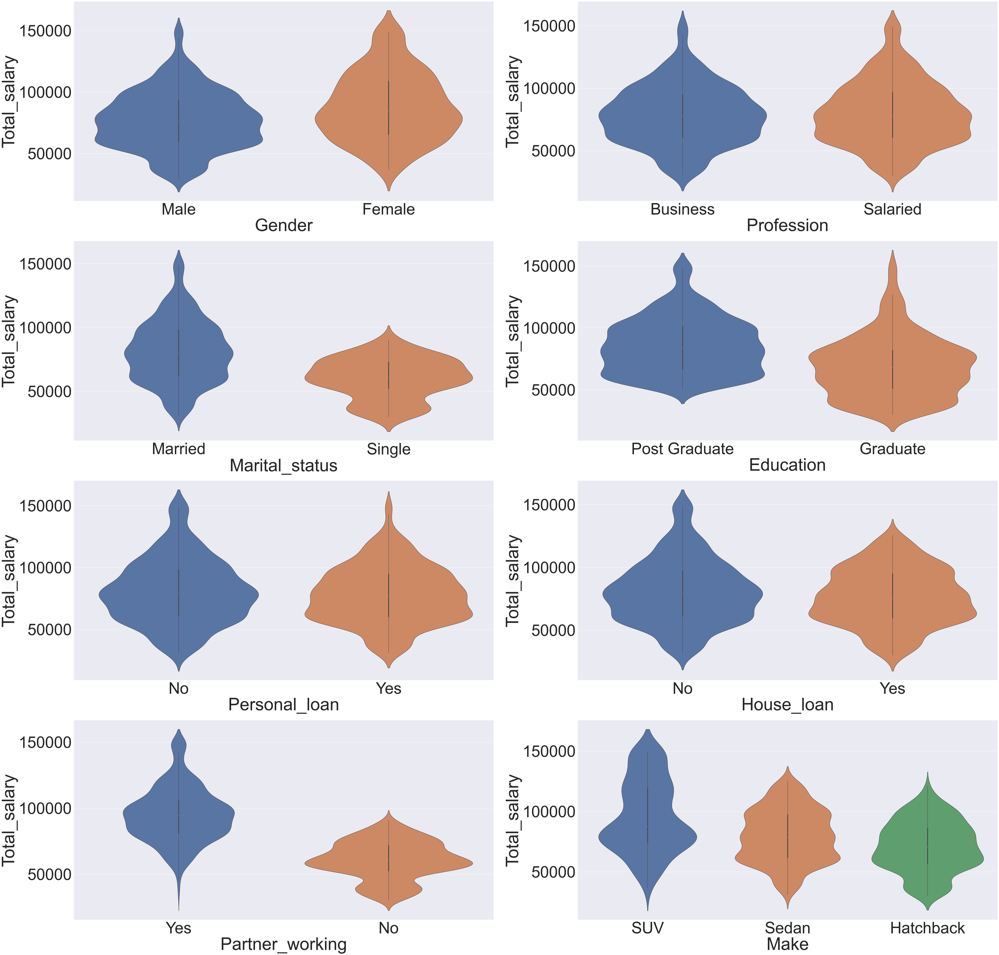

In [67]:
fig, axes = plt.subplots(nrows=4,ncols=2)
fig.set_size_inches(80,80)
sns.set(font_scale=7)
sns.violinplot(df_cars,x='Gender',y='Total_salary',ax=axes[0][0])
sns.violinplot(df_cars,x='Profession',y='Total_salary',ax=axes[0][1])
sns.violinplot(df_cars,x='Marital_status',y='Total_salary',ax=axes[1][0])
sns.violinplot(df_cars,x='Education',y='Total_salary',ax=axes[1][1])
sns.violinplot(df_cars,x='Personal_loan',y='Total_salary',ax=axes[2][0])
sns.violinplot(df_cars,x='House_loan',y='Total_salary',ax=axes[2][1])
sns.violinplot(df_cars,x='Partner_working',y='Total_salary',ax=axes[3][0])
sns.violinplot(df_cars,x='Make',y='Total_salary',ax=axes[3][1])

Finally, Sixth is between Price and all other categorical variables as shown below.

<Axes: xlabel='Make', ylabel='Price'>

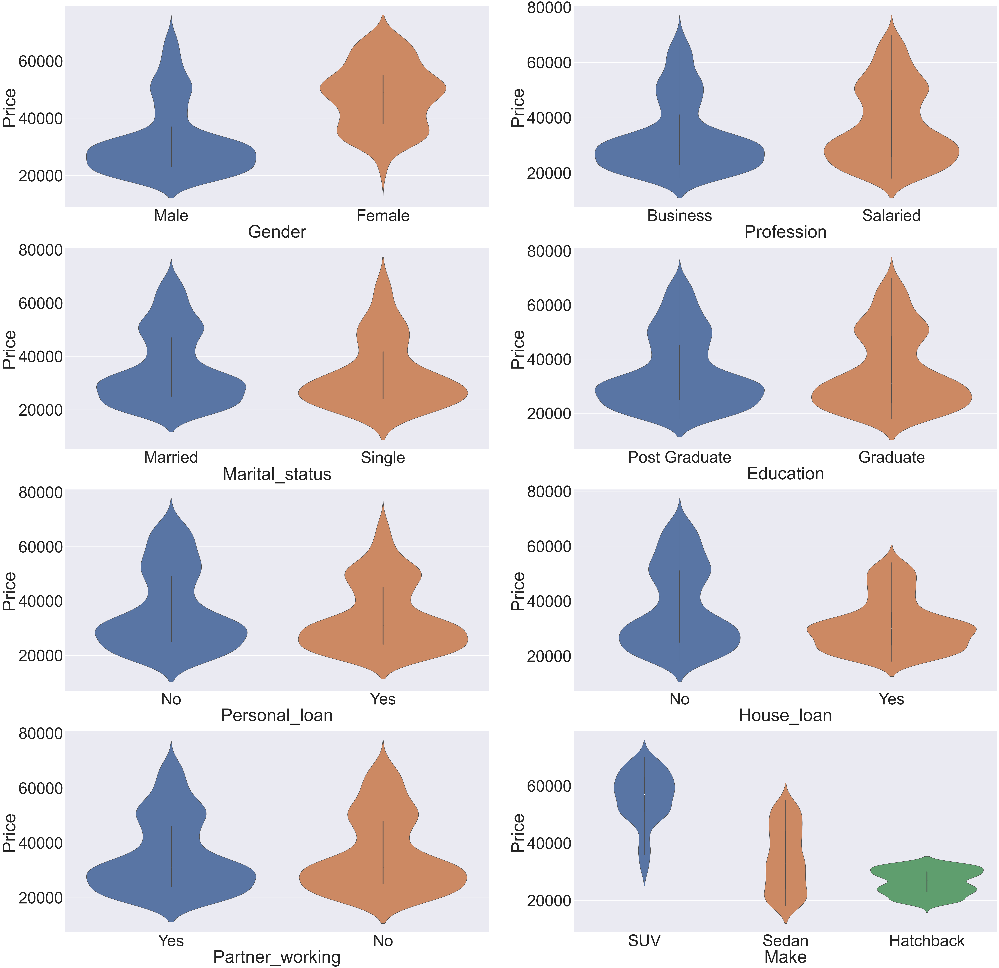

In [68]:
fig, axes = plt.subplots(nrows=4,ncols=2)
fig.set_size_inches(80,80)
sns.set(font_scale=7)
sns.violinplot(df_cars,x='Gender',y='Price',ax=axes[0][0])
sns.violinplot(df_cars,x='Profession',y='Price',ax=axes[0][1])
sns.violinplot(df_cars,x='Marital_status',y='Price',ax=axes[1][0])
sns.violinplot(df_cars,x='Education',y='Price',ax=axes[1][1])
sns.violinplot(df_cars,x='Personal_loan',y='Price',ax=axes[2][0])
sns.violinplot(df_cars,x='House_loan',y='Price',ax=axes[2][1])
sns.violinplot(df_cars,x='Partner_working',y='Price',ax=axes[3][0])
sns.violinplot(df_cars,x='Make',y='Price',ax=axes[3][1])

## Problem1-Key Questions
1.Do men tend to prefer SUVs more compared to women?

Gender  Make     
Female  Hatchback     15
        Sedan        141
        SUV          173
Male    SUV          124
        Sedan        561
        Hatchback    567
Name: count, dtype: int64


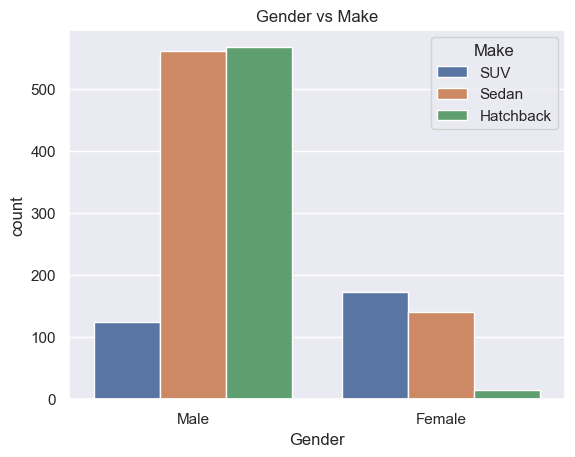

In [71]:
print(df_cars.groupby(['Gender'])['Make'].value_counts(ascending = True))
plt.title('Gender vs Make')
fig.set_size_inches(1,1)
sns.set(font_scale=1)
sns.countplot(df_cars,x='Gender',hue='Make');

Observation and Insight:
From the above we can say that,No men do not prefer SUVs more compared to women.

2. What is the likelihood of a salaried person buying a Sedan?

Profession  Make     
Business    SUV           89
            Hatchback    290
            Sedan        306
Salaried    SUV          208
            Hatchback    292
            Sedan        396
Name: count, dtype: int64
Profession
Salaried    896
Business    685
Name: count, dtype: int64
Salaried person likelihood for getting Hatchbacks =  0.32589285714285715
Salaried person likelihood for getting SUV =  0.23214285714285715
Salaried person likelihood for getting Sedan =  0.4419642857142857


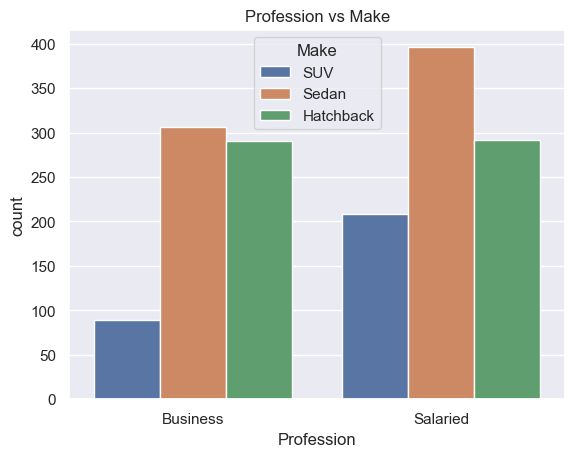

In [73]:
plt.title('Profession vs Make')
print(df_cars.groupby(['Profession'])['Make'].value_counts(ascending = True))
print(df_cars.Profession.value_counts())
print('Salaried person likelihood for getting Hatchbacks = ',292/896)
print('Salaried person likelihood for getting SUV = ',208/896)
print('Salaried person likelihood for getting Sedan = ',396/896)
fig.set_size_inches(1,1)
sns.set(font_scale=1)
sns.countplot(df_cars,x='Profession',hue='Make');

The likelihood is 44.2% to buy a sedan by a salaried person

3. What evidence or data supports Sheldon Cooper's claim that a salaried male is an easier target for a SUV sale over a Sedan sale? 

Gender  Profession  Make     
Female  Business    Sedan         50
                    SUV           55
        Salaried    Hatchback     15
                    Sedan         91
                    SUV          118
Male    Business    SUV           34
                    Sedan        256
                    Hatchback    290
        Salaried    SUV           90
                    Hatchback    277
                    Sedan        305
Name: count, dtype: int64
Gender  Profession
Female  Salaried      224
        Business      105
Male    Salaried      672
        Business      580
Name: count, dtype: int64
Possiblity for salaried Male bying a Hatchbacks =  0.41220238095238093
Possiblity for salaried Male bying a Hatchbacks SUV =  0.13392857142857142
Possiblity for salaried Male bying a Hatchbacks Sedan = 0.4538690476190476


<Axes: title={'center': 'Profession of Male vs Make'}, xlabel='Profession', ylabel='count'>

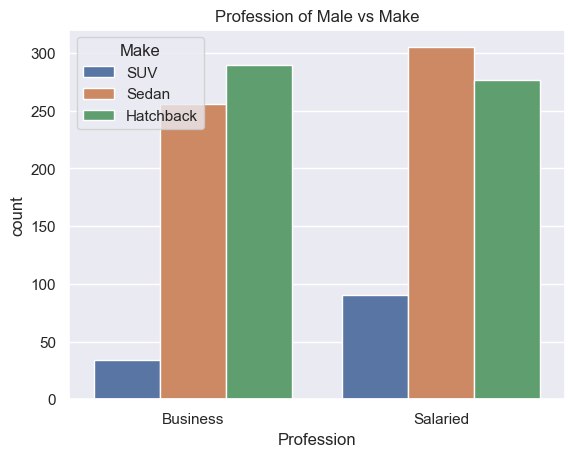

In [75]:
plt.title("Profession of Male vs Make")
print(df_cars.groupby(['Gender','Profession'])['Make'].value_counts(ascending = True))
print(df_cars.groupby(['Gender'])['Profession'].value_counts())
print('Possiblity for salaried Male bying a Hatchbacks = ',277/672)
print('Possiblity for salaried Male bying a Hatchbacks SUV = ',90/672)
print('Possiblity for salaried Male bying a Hatchbacks Sedan =',305/672)
df_male = df_cars[df_cars.Gender == 'Male']
fig.set_size_inches(1,1)
sns.set(font_scale=1)
sns.countplot(df_male,x='Profession',hue='Make')

Sheldon cooper's claim is wrong in fact from the above it can be said that45.38% male are easier traget for sedan.

4. How does the the amount spent on purchasing automobiles vary by gender?

Total sum Gender
Female    15695000
Male      40585000
Name: Price, dtype: int64
Mean Gender
Female    47705.167173
Male      32416.134185
Name: Price, dtype: float64
Median Gender
Female    49000.0
Male      29000.0
Name: Price, dtype: float64


<Axes: title={'center': 'Gender vs Price'}, xlabel='Gender', ylabel='Price'>

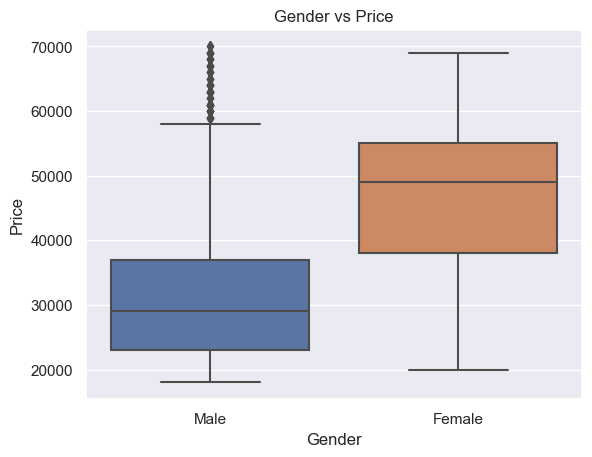

In [77]:
plt.title('Gender vs Price')
print('Total sum',df_cars.groupby(['Gender'])['Price'].sum())
print('Mean',df_cars.groupby(['Gender'])['Price'].mean())
print('Median',df_cars.groupby(['Gender'])['Price'].median())
fig.set_size_inches(1,1)
sns.set(font_scale=1)
sns.boxplot(df_cars,x='Gender',y='Price')

5. How much money was spent on purchasing automobiles by individuals who took a personal loan?

Total sum Marital_status  Personal_loan
Married         No               26721000
                Yes              24939000
Single          No                2269000
                Yes               2351000
Name: Price, dtype: int64
Mean Marital_status  Personal_loan
Married         No               36958.506224
                Yes              34637.500000
Single          No               34378.787879
                Yes              32652.777778
Name: Price, dtype: float64
Median Marital_status  Personal_loan
Married         No               32000.0
                Yes              31000.0
Single          No               31000.0
                Yes              28000.0
Name: Price, dtype: float64


<Axes: title={'center': 'Personal loan  vs Price for a unmarried person '}, xlabel='Personal_loan', ylabel='Price'>

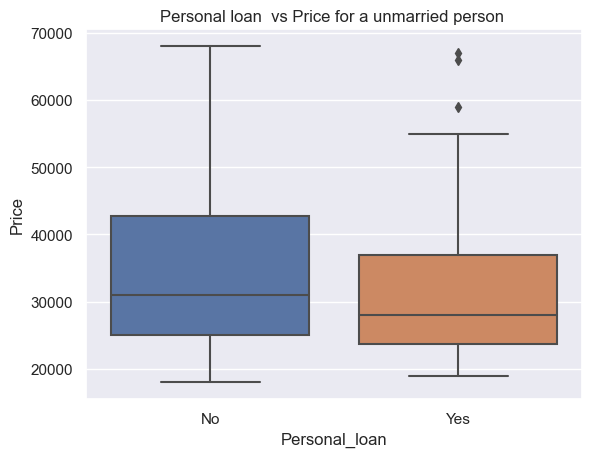

In [79]:
plt.title('Personal loan  vs Price for a unmarried person ')
print('Total sum',df_cars.groupby(['Marital_status','Personal_loan'])['Price'].sum())
print('Mean',df_cars.groupby(['Marital_status','Personal_loan'])['Price'].mean())
print('Median',df_cars.groupby(['Marital_status','Personal_loan'])['Price'].median())
df_single = df_cars[df_cars.Marital_status == 'Single']
fig.set_size_inches(1,1)
sns.set(font_scale=1)
sns.boxplot(df_single,x='Personal_loan',y='Price')

6. How does having a working partner influence the purchase of higher-priced cars?

Total Sum Partner_working
No     25668000
Yes    30612000
Name: Price, dtype: int64
Mean Partner_working
No     36000.000000
Yes    35267.281106
Name: Price, dtype: float64
Median Partner_working
No     31000.0
Yes    31000.0
Name: Price, dtype: float64


<Axes: title={'center': 'Partner working vs Price'}, xlabel='Partner_working', ylabel='Price'>

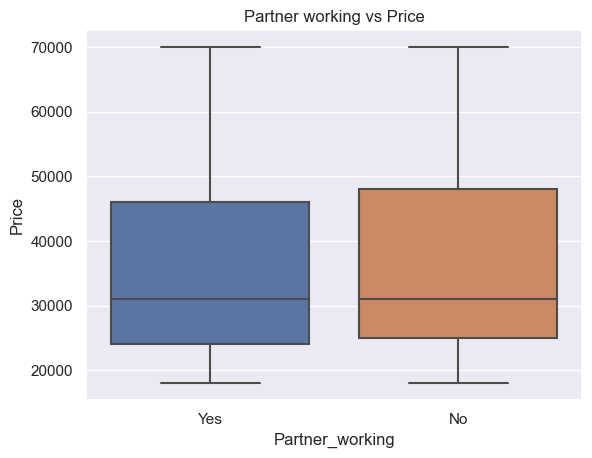

In [81]:
plt.title('Partner working vs Price')
print('Total Sum',df_cars.groupby(['Partner_working'])['Price'].sum())
print('Mean',df_cars.groupby(['Partner_working'])['Price'].mean())
print('Median',df_cars.groupby(['Partner_working'])['Price'].median())
fig.set_size_inches(1,1)
sns.set(font_scale=1)
sns.boxplot(df_cars,x='Partner_working',y='Price')

From the above observation it can be said that, for better marketting improvement the three variables: Gender, Marital Status and Make should be used.

And as shown below the comapny for marketing campaing should target more people who are married. And also, in that for Male married customers,they prefer sedan and hactback more compared to SUV. Also, for Female married customers prefer SUVs and Sedan compared to Hachback.

In [82]:
print(df_cars.groupby(['Gender','Marital_status'])['Make'].value_counts())
df_male = df_cars[df_cars.Gender == 'Male']
df_female = df_cars[df_cars.Gender == 'Female']

Gender  Marital_status  Make     
Female  Married         SUV          166
                        Sedan        127
                        Hatchback     14
        Single          Sedan         14
                        SUV            7
                        Hatchback      1
Male    Married         Sedan        537
                        Hatchback    484
                        SUV          115
        Single          Hatchback     83
                        Sedan         24
                        SUV            9
Name: count, dtype: int64


<Axes: title={'center': 'Marital satuts vs make for Male'}, xlabel='Marital_status', ylabel='count'>

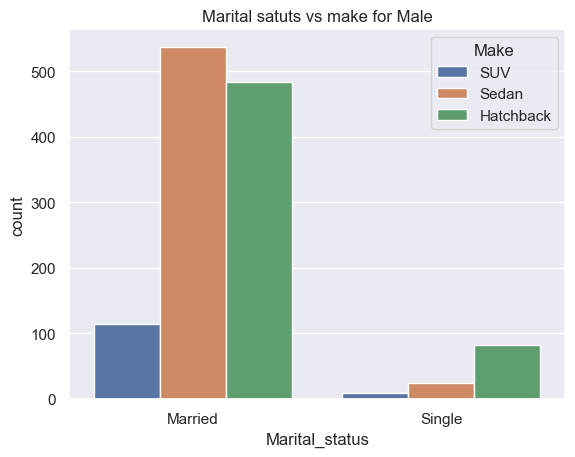

In [84]:
plt.title('Marital satuts vs make for Male')
fig.set_size_inches(1,1)
sns.set(font_scale=1)
sns.countplot(df_male,x='Marital_status',hue='Make')

<Axes: title={'center': 'Marital satuts vs make for Female'}, xlabel='Marital_status', ylabel='count'>

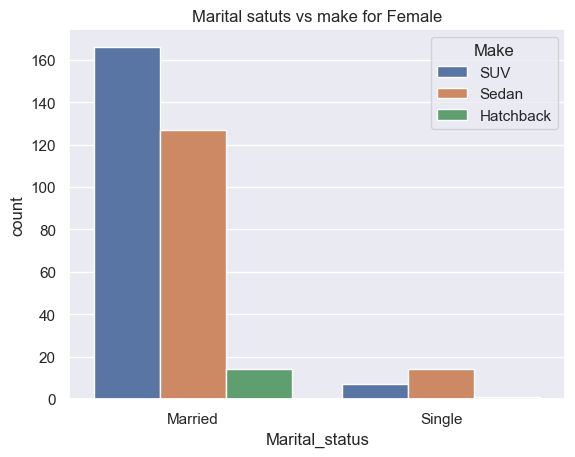

In [86]:
plt.title('Marital satuts vs make for Female')
fig.set_size_inches(1,1)
sns.set(font_scale=1)
sns.countplot(df_female,x='Marital_status',hue='Make')

# Problem-2:

In this the GODIGT Bank is facing high credit card attrition, which lead them to re-evaluate their credit card policies to ensure that, their customers receive right cards for higher spending and intent for better profitable relationship.

We as a Data Scientist are suppose to find the 5 key variables that have vital importance for analysis and help improve business.

First load the dataset of the bank and read the first and last five rows of the dataset.

In [46]:
df_bank = pd.read_excel('godigt_cc_data.xlsx')
df_bank.head()

,userid,card_no,card_bin_no,Issuer,card_type,card_source_date,high_networth,active_30,active_60,active_90,...,bank_vintage,T+1_month_activity,T+2_month_activity,T+3_month_activity,T+6_month_activity,T+12_month_activity,Transactor_revolver,avg_spends_l3m,Occupation_at_source,cc_limit
0,1,4384 39XX XXXX XXXX,438439,Visa,edge,2019-09-29,B,0,1,1,...,27,0,0,0,0,0,T,27729,Self Employed,290000
1,2,4377 48XX XXXX XXXX,437748,Visa,prosperity,2002-10-30,A,1,1,1,...,52,0,0,0,0,0,R,280854,0,950000
2,3,4377 48XX XXXX XXXX,437748,Visa,rewards,2013-10-05,C,0,0,0,...,23,1,0,0,0,0,R,70587,Student,210000
3,4,4258 06XX XXXX XXXX,425806,Visa,indianoil,1999-06-01,E,0,1,1,...,49,0,0,1,0,0,T,9156,Self Employed,80000
4,5,4377 48XX XXXX XXXX,437748,Visa,edge,2006-06-13,B,1,1,1,...,21,1,0,0,0,0,T,38108,Salaried,220000


In [47]:
df_bank.tail()

,userid,card_no,card_bin_no,Issuer,card_type,card_source_date,high_networth,active_30,active_60,active_90,...,bank_vintage,T+1_month_activity,T+2_month_activity,T+3_month_activity,T+6_month_activity,T+12_month_activity,Transactor_revolver,avg_spends_l3m,Occupation_at_source,cc_limit
8443,8444,4262 41XX XXXX XXXX,426241,Visa,chartered,2010-01-10,A,1,1,1,...,47,0,0,0,0,0,T,108713,0,970000
8444,8445,37691 6XXXX XXXXX,376916,Amex,centurion,2006-07-19,A,0,1,1,...,52,0,0,0,0,0,T,42369,Salaried,200000
8445,8446,4375 51XX XXXX XXXX,437551,Visa,rewards,2006-02-15,D,0,1,1,...,36,0,0,0,0,0,T,8459,Retired,90000
8446,8447,4477 47XX XXXX XXXX,447747,Visa,indianoil,2003-11-06,C,0,0,0,...,54,1,0,0,0,0,T,57100,Salaried,210000
8447,8448,4262 41XX XXXX XXXX,426241,Visa,rewards,2013-01-13,D,0,1,1,...,37,0,0,0,0,0,T,45244,Retired,130000


See the data structure and using shape, info, describe function.

In [99]:
df_bank.shape

(8448, 28)

In [48]:
df_bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8448 entries, 0 to 8447
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   userid                   8448 non-null   int64         
 1   card_no                  8448 non-null   object        
 2   card_bin_no              8448 non-null   int64         
 3   Issuer                   8448 non-null   object        
 4   card_type                8448 non-null   object        
 5   card_source_date         8448 non-null   datetime64[ns]
 6   high_networth            8448 non-null   object        
 7   active_30                8448 non-null   int64         
 8   active_60                8448 non-null   int64         
 9   active_90                8448 non-null   int64         
 10  cc_active30              8448 non-null   int64         
 11  cc_active60              8448 non-null   int64         
 12  cc_active90              8448 non-

In [49]:
df_bank.describe()

,userid,card_bin_no,card_source_date,active_30,active_60,active_90,cc_active30,cc_active60,cc_active90,widget_products,engagement_products,annual_income_at_source,bank_vintage,T+1_month_activity,T+2_month_activity,T+3_month_activity,T+6_month_activity,T+12_month_activity,avg_spends_l3m,cc_limit
count,8448.00000,8448.000000,8448,8448.000000,8448.000000,8448.000000,8448.000000,8448.000000,8448.000000,8448.000000,8448.000000,8.448000e+03,8448.000000,8448.000000,8448.000000,8448.000000,8448.000000,8448.000000,8448.000000,8448.000000
mean,4224.50000,436747.044508,2009-06-19 13:35:17.045454592,0.292377,0.494792,0.642045,0.284091,0.484493,0.632339,3.614583,3.991122,1.674595e+06,33.164181,0.111269,0.047940,0.080374,0.008878,0.009470,49527.365530,251706.912879
min,1.00000,376916.000000,1998-07-24 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000950e+05,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2112.75000,426241.000000,2004-01-07 18:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,1.061104e+06,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17110.000000,90000.000000
50%,4224.50000,437551.000000,2009-05-24 12:00:00,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,4.000000,4.000000,1.372134e+06,33.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37943.000000,150000.000000
75%,6336.25000,438439.000000,2014-11-27 06:00:00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000,6.000000,1.881734e+06,47.000000,0.000000,0.000000,0.000000,0.000000,0.000000,66095.750000,350000.000000
max,8448.00000,524178.000000,2020-06-17 00:00:00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000,8.000000,4.999508e+06,60.000000,1.000000,1.000000,1.000000,1.000000,1.000000,289292.000000,990000.000000
std,2438.87187,30489.752417,NaN,0.454881,0.500002,0.479427,0.451007,0.499789,0.482197,2.273193,2.572135,1.064307e+06,15.868344,0.314483,0.213653,0.271888,0.093809,0.096856,46244.954836,229114.856385


We look for any duplicated row and see for empty values or any anomailies and treat the variables accordingly.

In [50]:
df_bank.duplicated().sum()

0

In [51]:
df_bank.isnull().sum()

userid                      0
card_no                     0
card_bin_no                 0
Issuer                      0
card_type                   0
card_source_date            0
high_networth               0
active_30                   0
active_60                   0
active_90                   0
cc_active30                 0
cc_active60                 0
cc_active90                 0
hotlist_flag                0
widget_products             0
engagement_products         0
annual_income_at_source     0
other_bank_cc_holding       0
bank_vintage                0
T+1_month_activity          0
T+2_month_activity          0
T+3_month_activity          0
T+6_month_activity          0
T+12_month_activity         0
Transactor_revolver        38
avg_spends_l3m              0
Occupation_at_source        0
cc_limit                    0
dtype: int64

In [52]:
print(df_bank.Issuer.value_counts())
print(df_bank.card_type.value_counts())
print(df_bank.high_networth.value_counts())
print(df_bank.hotlist_flag.value_counts())
print(df_bank.other_bank_cc_holding.value_counts())
print(df_bank.Transactor_revolver.value_counts())
print(df_bank.Occupation_at_source.value_counts())

Issuer
Visa          7279
Mastercard     728
Amex           441
Name: count, dtype: int64
card_type
rewards       1502
prosperity    1007
edge           980
chartered      923
smartearn      765
shoprite       688
indianoil      680
cashback       676
aura           652
gold           145
prime          112
pulse          101
elite           96
centurion       62
platinum        59
Name: count, dtype: int64
high_networth
A    1740
D    1696
E    1693
B    1660
C    1659
Name: count, dtype: int64
hotlist_flag
N    8410
Y      38
Name: count, dtype: int64
other_bank_cc_holding
Y    4728
N    3720
Name: count, dtype: int64
Transactor_revolver
T    7115
R    1295
Name: count, dtype: int64
Occupation_at_source
Salaried         3918
Self Employed    2175
Retired          1089
Student           621
Housewife         384
0                 261
Name: count, dtype: int64


In [53]:
df_bank.Occupation_at_source.unique()

array(['Self Employed', 0, 'Student', 'Salaried', 'Retired', 'Housewife'],
      dtype=object)

In [54]:
df_bank.Occupation_at_source.mode()

0    Salaried
Name: Occupation_at_source, dtype: object

In [55]:
df_bank.Occupation_at_source = df_bank.Occupation_at_source.replace(0, 'Salaried')
print(df_bank.Occupation_at_source.unique())
print(df_bank.Occupation_at_source.value_counts())

['Self Employed' 'Salaried' 'Student' 'Retired' 'Housewife']
Occupation_at_source
Salaried         4179
Self Employed    2175
Retired          1089
Student           621
Housewife         384
Name: count, dtype: int64


In [56]:
df_bank.Transactor_revolver.unique()

array(['T', 'R', nan], dtype=object)

In [57]:
df_bank.Transactor_revolver.mode()

0    T
Name: Transactor_revolver, dtype: object

In [58]:
df_bank.Transactor_revolver = df_bank.Transactor_revolver.fillna('T')

In [59]:
df_bank.isnull().sum()

userid                     0
card_no                    0
card_bin_no                0
Issuer                     0
card_type                  0
card_source_date           0
high_networth              0
active_30                  0
active_60                  0
active_90                  0
cc_active30                0
cc_active60                0
cc_active90                0
hotlist_flag               0
widget_products            0
engagement_products        0
annual_income_at_source    0
other_bank_cc_holding      0
bank_vintage               0
T+1_month_activity         0
T+2_month_activity         0
T+3_month_activity         0
T+6_month_activity         0
T+12_month_activity        0
Transactor_revolver        0
avg_spends_l3m             0
Occupation_at_source       0
cc_limit                   0
dtype: int64

In [60]:
df_bank.describe().T

,count,mean,min,25%,50%,75%,max,std
userid,8448.0,4224.5,1.0,2112.75,4224.5,6336.25,8448.0,2438.87187
card_bin_no,8448.0,436747.044508,376916.0,426241.0,437551.0,438439.0,524178.0,30489.752417
card_source_date,8448,2009-06-19 13:35:17.045454592,1998-07-24 00:00:00,2004-01-07 18:00:00,2009-05-24 12:00:00,2014-11-27 06:00:00,2020-06-17 00:00:00,NaN
active_30,8448.0,0.292377,0.0,0.0,0.0,1.0,1.0,0.454881
active_60,8448.0,0.494792,0.0,0.0,0.0,1.0,1.0,0.500002
active_90,8448.0,0.642045,0.0,0.0,1.0,1.0,1.0,0.479427
cc_active30,8448.0,0.284091,0.0,0.0,0.0,1.0,1.0,0.451007
cc_active60,8448.0,0.484493,0.0,0.0,0.0,1.0,1.0,0.499789
cc_active90,8448.0,0.632339,0.0,0.0,1.0,1.0,1.0,0.482197
widget_products,8448.0,3.614583,0.0,2.0,4.0,6.0,7.0,2.273193


Now from the bussiness point of view we have to think and ask some question like:

1.How much does the customer on an average uses the credit cards? Can we find out the correlation between there aveage spend, income and credit card limit? 

2.What type card of does the customer uses the most? 

3.What is the income and occupation of the customer? 

4.In last 30 days how much has the customer spend and what is there cc_limit compared to there Occupation? 

1.How much does the customer on an average uses the credit cards? Can we find out the correlation between there aveage spend, income and credit card limit?

<Axes: >

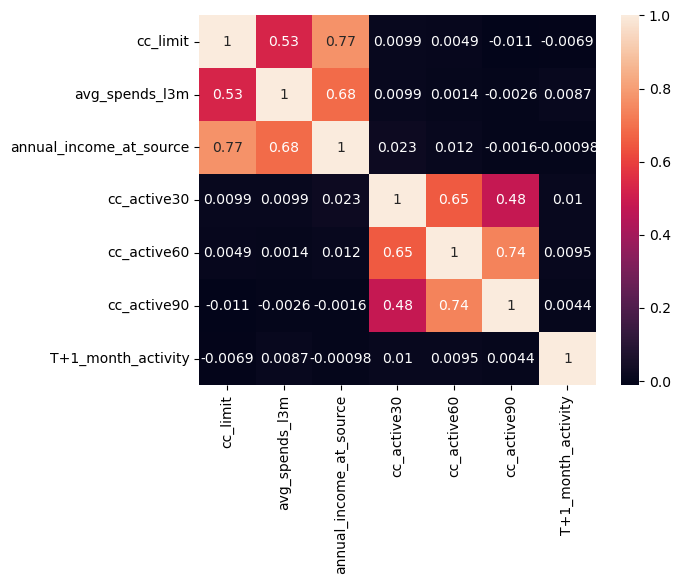

In [61]:
df_b1 = df_bank[['cc_limit','avg_spends_l3m','annual_income_at_source','cc_active30','cc_active60','cc_active90','T+1_month_activity']]
df_b2 = df_b1.corr()
sns.heatmap(df_b2, annot=True)

2.What type card of does the customer uses the most?

<Axes: title={'center': 'Countplot for Card type'}, xlabel='card_type', ylabel='count'>

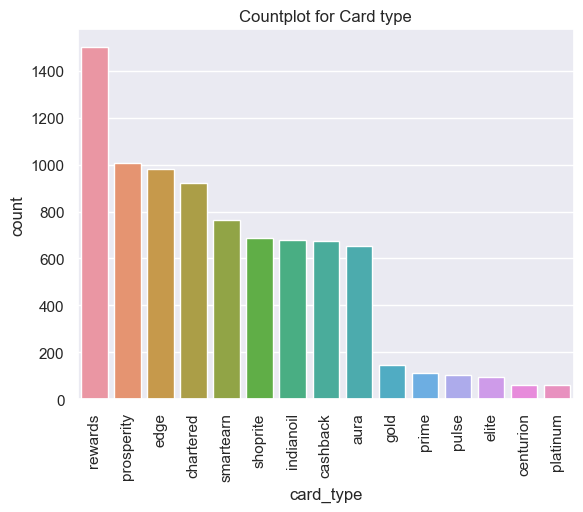

In [90]:
plt.title("Countplot for Card type")
descend_order = df_bank.card_type.value_counts().index
#plt.figure(figsize(20,10))
plt.xticks(rotation = 90)
sns.countplot(df_bank,x='card_type',order= descend_order)

3.What is the income and occupation of the customer? 
 

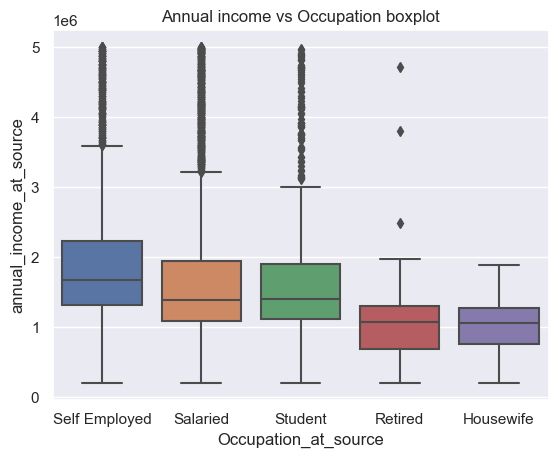

In [92]:
plt.title('Annual income vs Occupation boxplot')
sns.boxplot(df_bank,x='Occupation_at_source',y='annual_income_at_source');


4.In last 30 days how much has the customer spend and what is there cc_limit compared to there occupation?

<Axes: title={'center': 'Occupation vs Cerdit card limit for credit card activity 30 days'}, xlabel='Occupation_at_source', ylabel='cc_limit'>

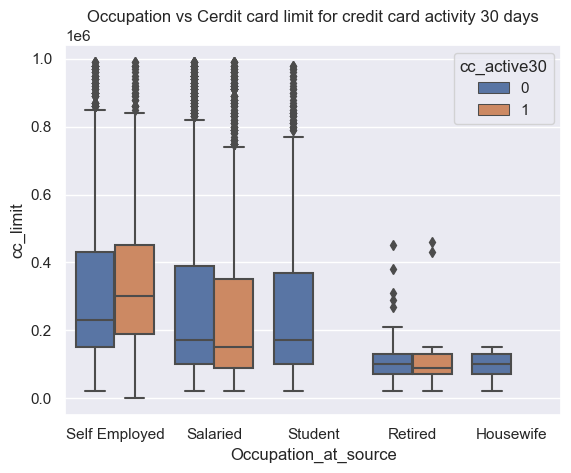

In [98]:
plt.title('Occupation vs Cerdit card limit for credit card activity 30 days')
sns.boxplot(df_bank,y='cc_limit',x='Occupation_at_source',hue='cc_active30')

Thus we from the above question we got the five important variables that are necessary and they are:

1. CC_limt
2. annunal_income_at_source
3. avg_spend_I3m
4. cc_acitive30
5. Occupation_at_source